<a href="https://colab.research.google.com/github/CaballeroPCarlos/Proyecto---Grupo-2---SCIC/blob/main/script/Proyecto.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.0/887.0 kB 24.8 MB/s eta 0:00:00


In [2]:
from ultralytics import YOLO
import os
from IPython import display
display.clear_output()
!yolo mode=checks

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/__init__.py", line 908, in entrypoint
    raise ValueError(f"Invalid 'mode={mode}'. Valid modes are {MODES}.\n{CLI_HELP_MSG}")
ValueError: Invalid 'mode=<module 'ultralytics.utils.checks' from '/usr/local/lib/python3.10/dist-packages/ultralytics/utils/checks.py'>'. Valid modes are {'export', 'predict', 'track', 'val', 'benchmark', 'train'}.

    Arguments received: ['yolo', 'mode=checks']. Ultralytics 'yolo' commands use the following syntax:

        yolo TASK MODE ARGS

        Where   TASK (optional) is one of {'detect', 'segment', 'classify', 'obb', 'pose'}
                MODE (required) is one of {'export', 'predict', 'track', 'val', 'benchmark', 'train'}
                ARGS (optional) are any number of custom 'arg=value' pairs like 'imgsz=320' that override defaults.
                    See all ARGS at ht

In [3]:
from IPython.display import Image

In [4]:
import zipfile

zip_path = '/content/proyecto.zip'  # Ruta al archivo ZIP en Google Drive
extract_path = '/content'  # Ruta donde extraer los archivos

try:
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)
    print("Archivo extraído correctamente.")
except zipfile.BadZipFile:
    print("El archivo no es un ZIP válido.")
except Exception as e:
    print(f"Ocurrió un error: {e}")


Archivo extraído correctamente.


In [5]:
!yolo task=detect mode=train model=yolo11m.pt data=/content/proyecto/data.yaml epochs=20 imgsz=720

100% 38.8M/38.8M [00:00<00:00, 273MB/s]
Ultralytics 8.3.32 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11m.pt, data=/content/proyecto/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=720, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, sho

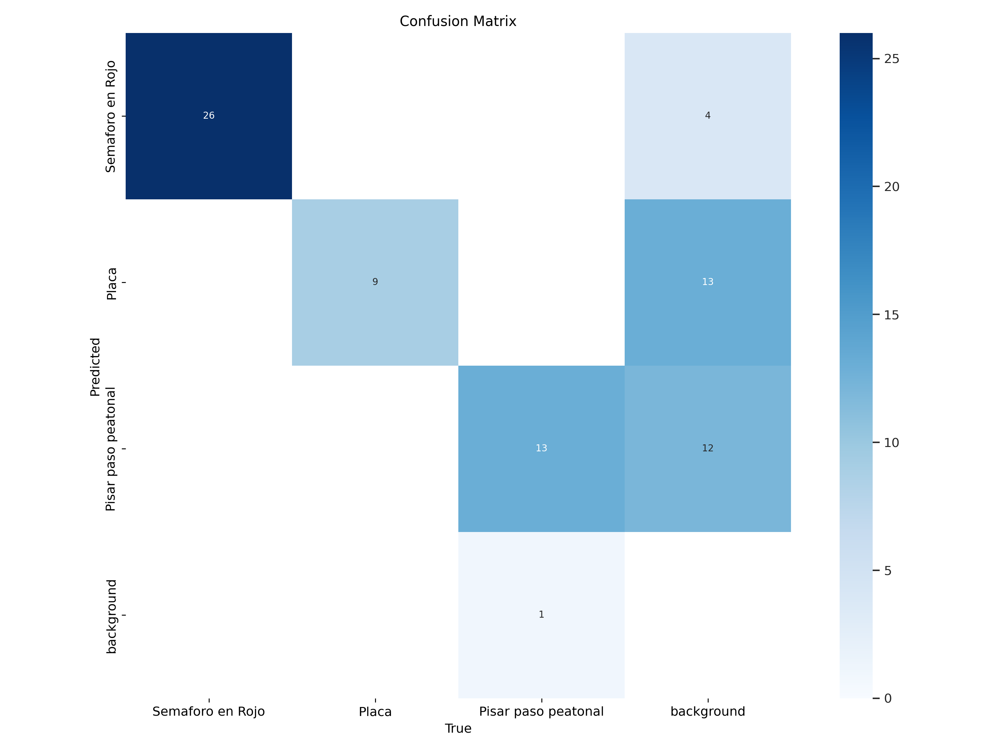

In [6]:
Image(filename=f'/content/runs/detect/train/confusion_matrix.png', width=600)

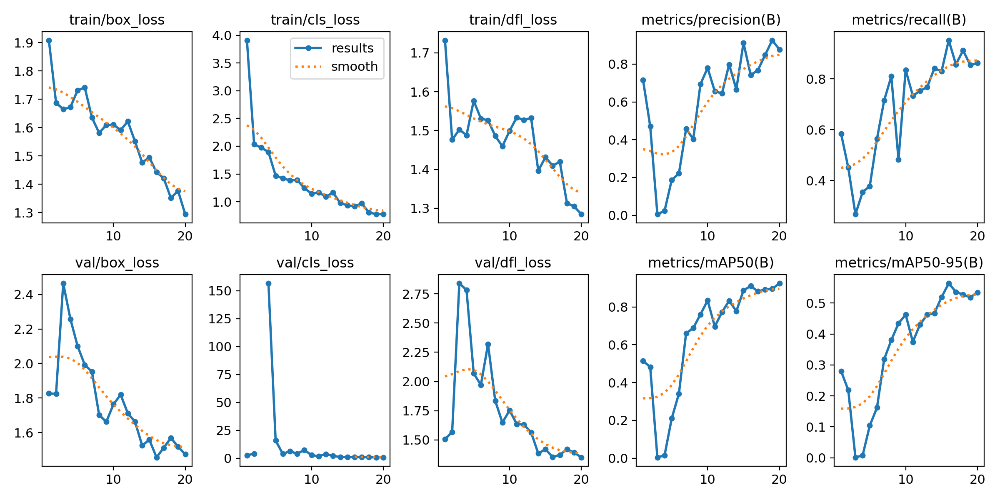

In [7]:
Image(filename=f'/content/runs/detect/train/results.png', width=600)

In [8]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data=/content/proyecto/data.yaml

Ultralytics 8.3.32 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11m summary (fused): 303 layers, 20,032,345 parameters, 0 gradients, 67.7 GFLOPs
val: Scanning /content/proyecto/val/labels.cache... 32 images, 0 backgrounds, 0 corrupt: 100% 32/32 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 2/2 [00:02<00:00,  1.05s/it]
                   all         32         49      0.743      0.952      0.911       0.57
      Semaforo en Rojo         14         26       0.92          1      0.959      0.531
                 Placa          9          9      0.574          1      0.995      0.727
   Pisar paso peatonal          9         14      0.736      0.857      0.779      0.453
Speed: 0.4ms preprocess, 31.4ms inference, 0.0ms loss, 19.2ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


In [10]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.5 source=/content/proyecto/test/images

Ultralytics 8.3.32 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11m summary (fused): 303 layers, 20,032,345 parameters, 0 gradients, 67.7 GFLOPs

image 1/32 /content/proyecto/test/images/IMG-20241023-WA0054.jpg: 576x736 3 Placas, 46.7ms
image 2/32 /content/proyecto/test/images/IMG-20241023-WA0064.jpg: 576x736 1 Placa, 36.2ms
image 3/32 /content/proyecto/test/images/IMG-20241023-WA0074.jpg: 576x736 2 Placas, 36.1ms
image 4/32 /content/proyecto/test/images/IMG-20241023-WA0084.jpg: 576x736 2 Placas, 36.2ms
image 5/32 /content/proyecto/test/images/IMG-20241026-WA0024.jpg: 576x736 3 Pisar paso peatonals, 27.8ms
image 6/32 /content/proyecto/test/images/IMG-20241026-WA0034.jpg: 576x736 1 Pisar paso peatonal, 27.8ms
image 7/32 /content/proyecto/test/images/IMG-20241026-WA0044.jpg: 576x736 1 Pisar paso peatonal, 27.8ms
image 8/32 /content/proyecto/test/images/IMG-20241026-WA0054.jpg: 576x736 1 Pisar paso peatonal, 27.8ms
image 9/32 /content/proyecto/test/images/IMG-2024102

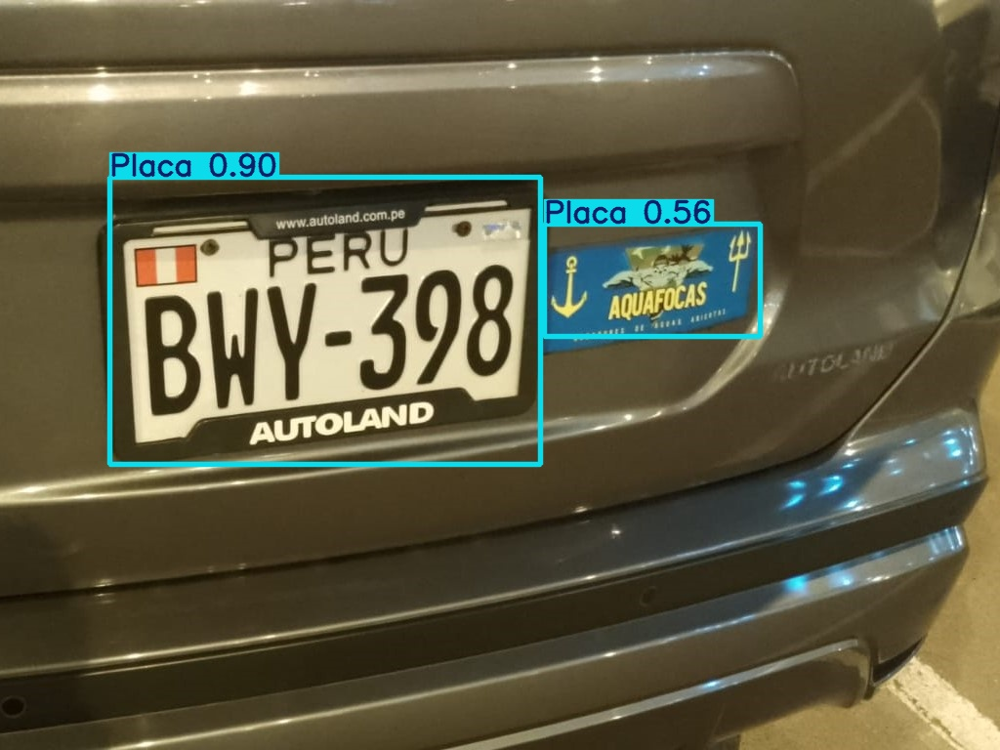

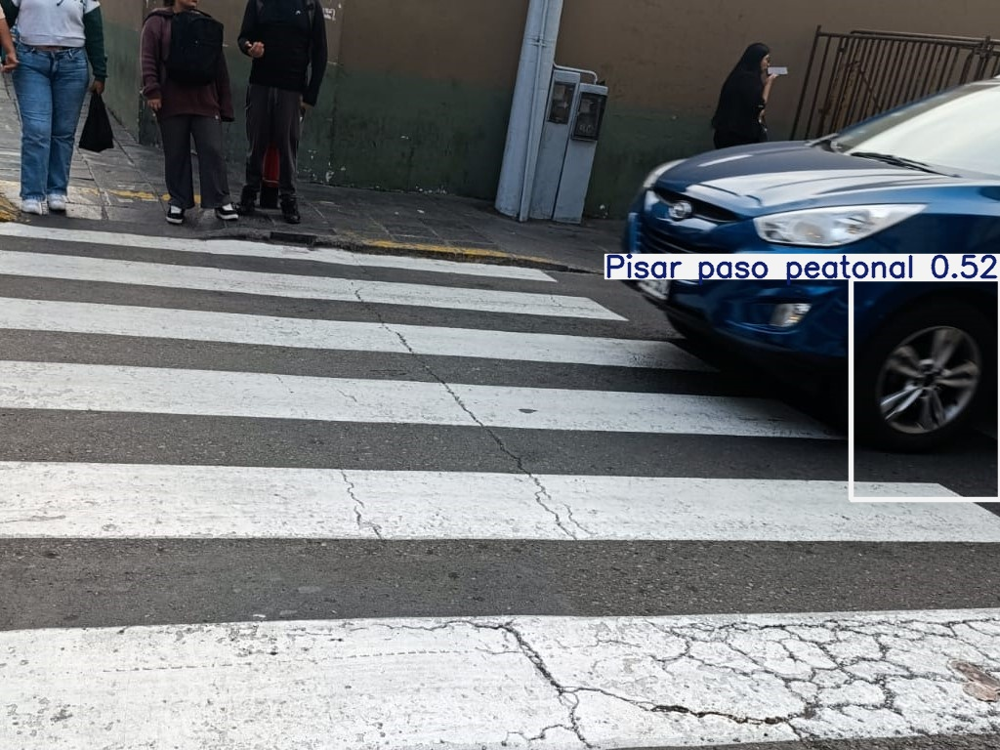

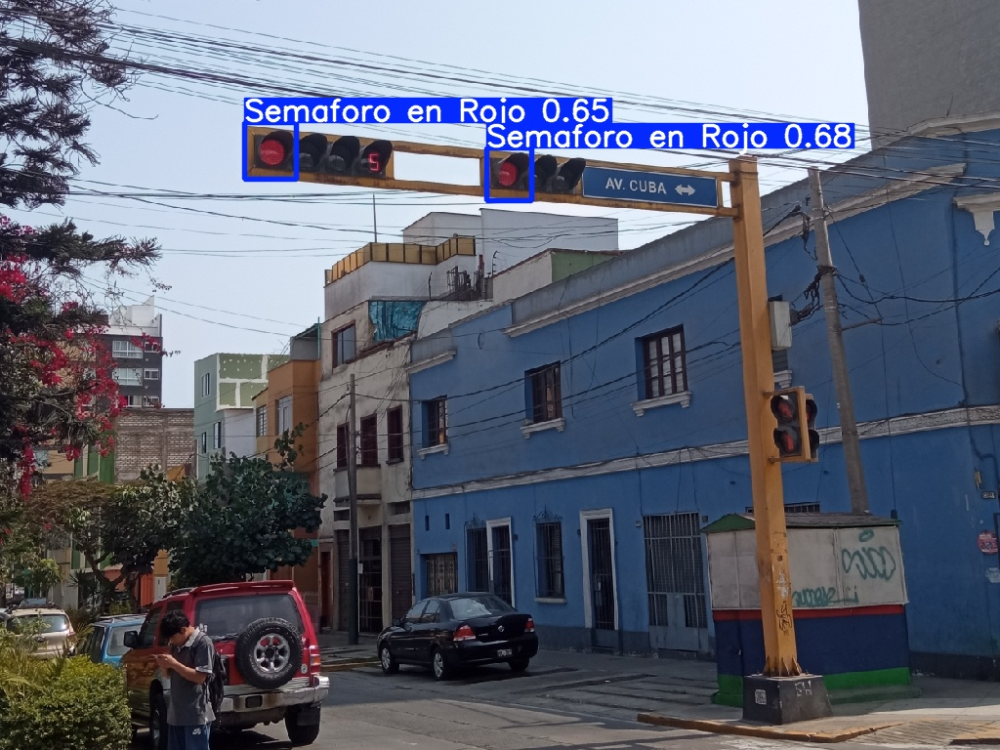

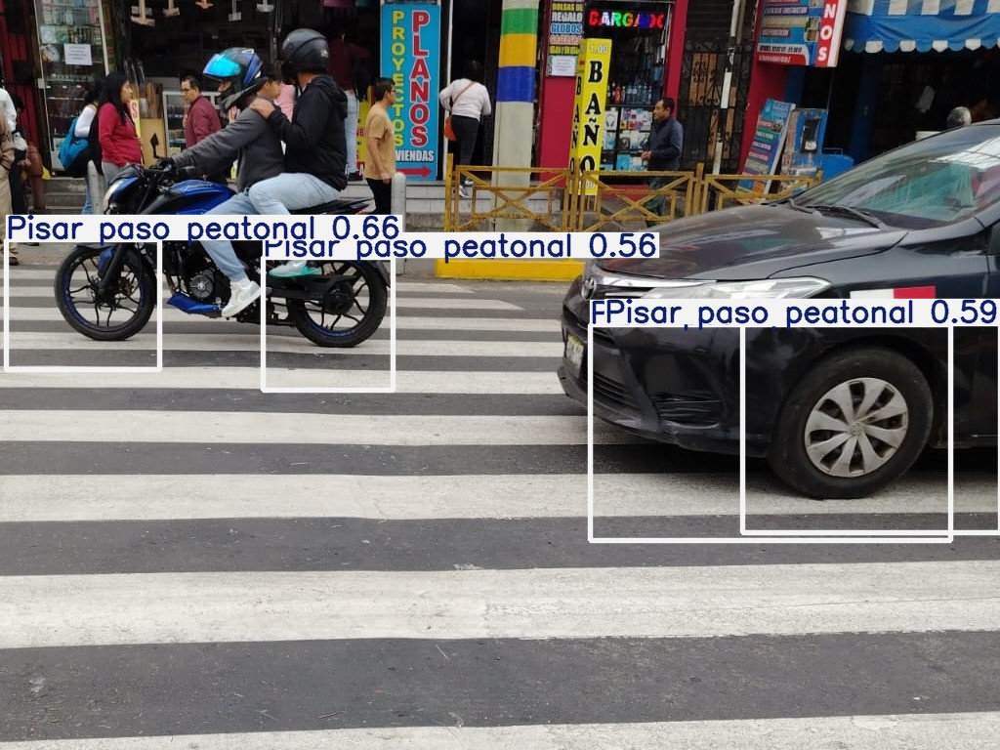

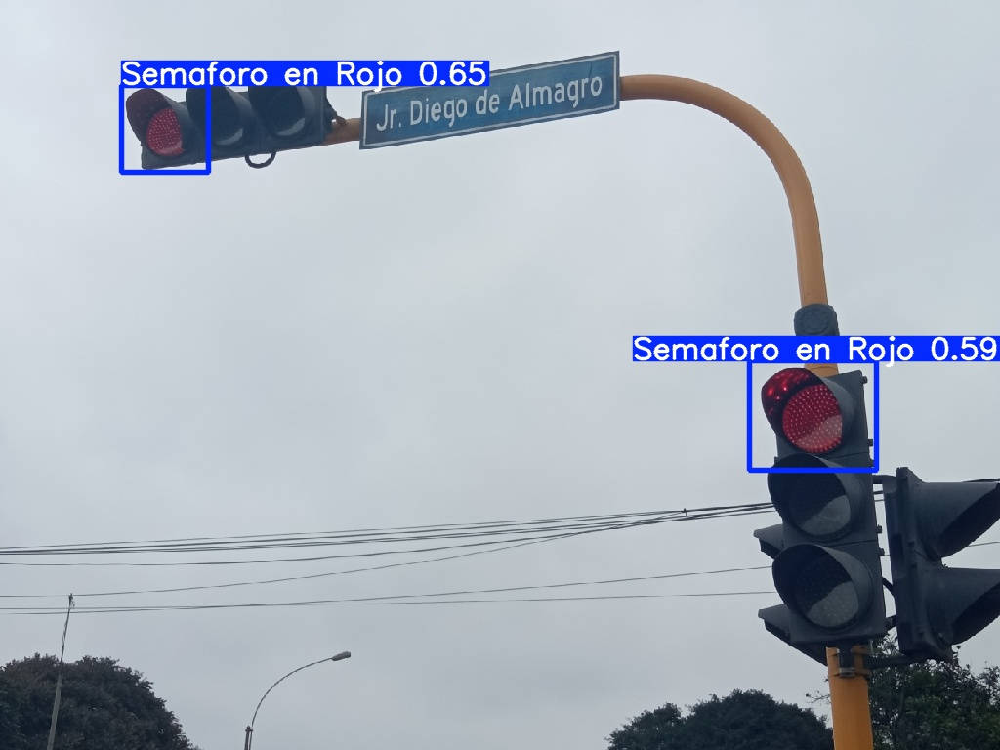

...

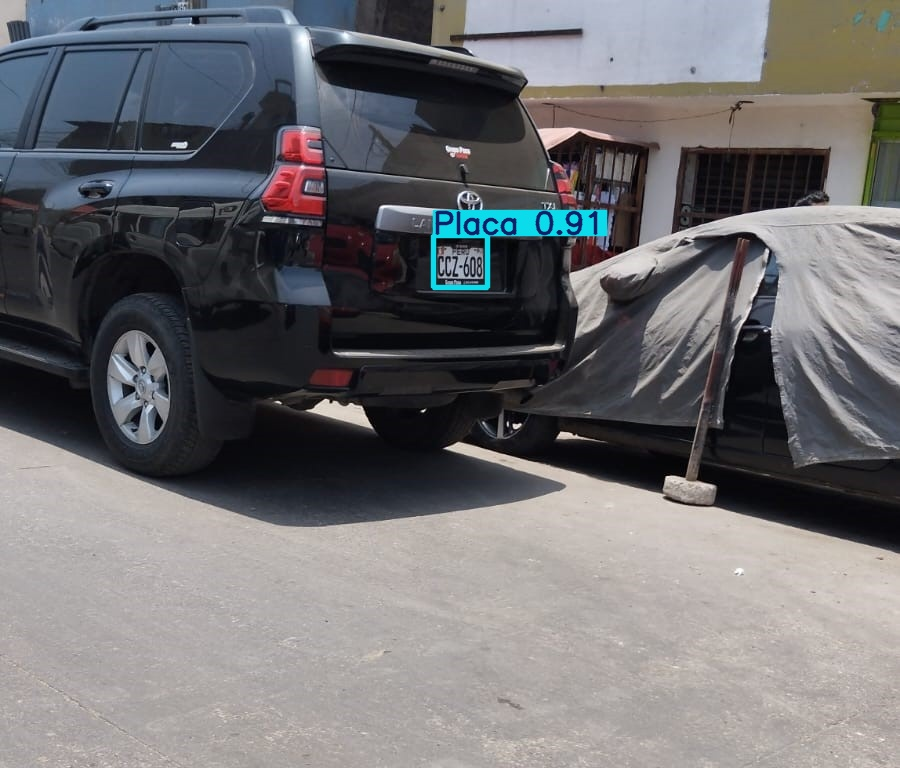

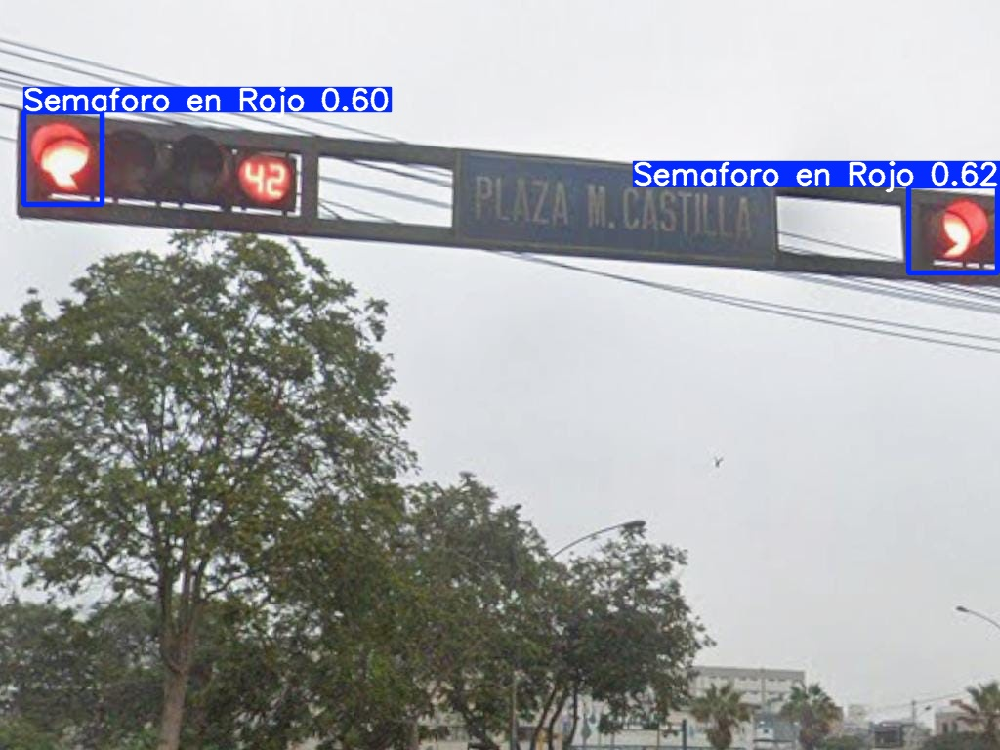

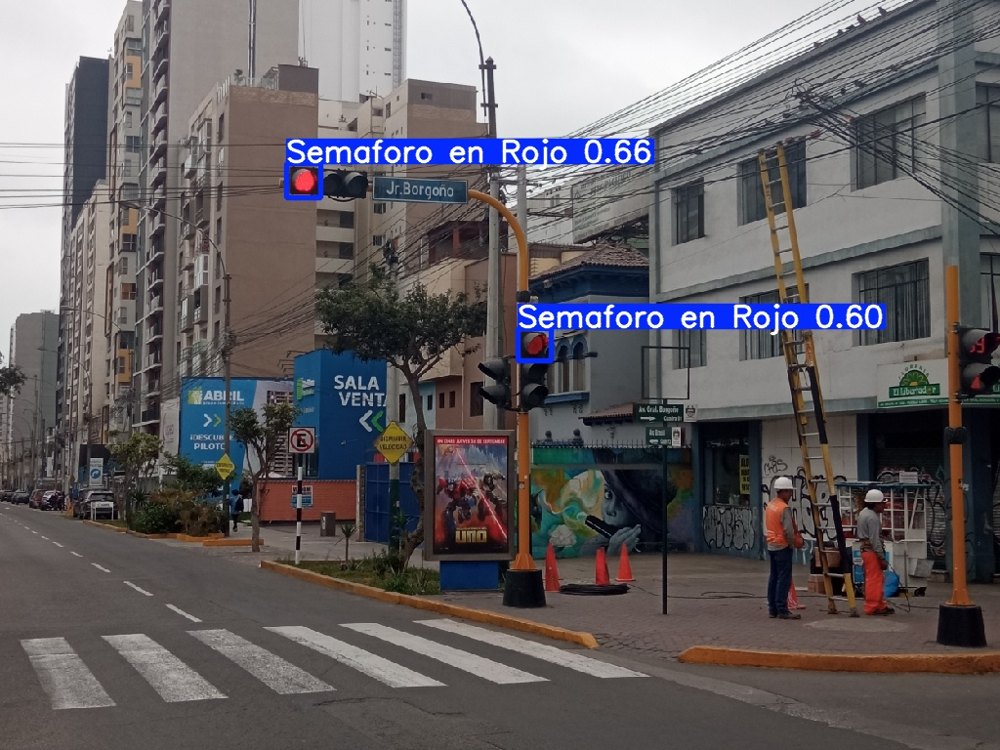

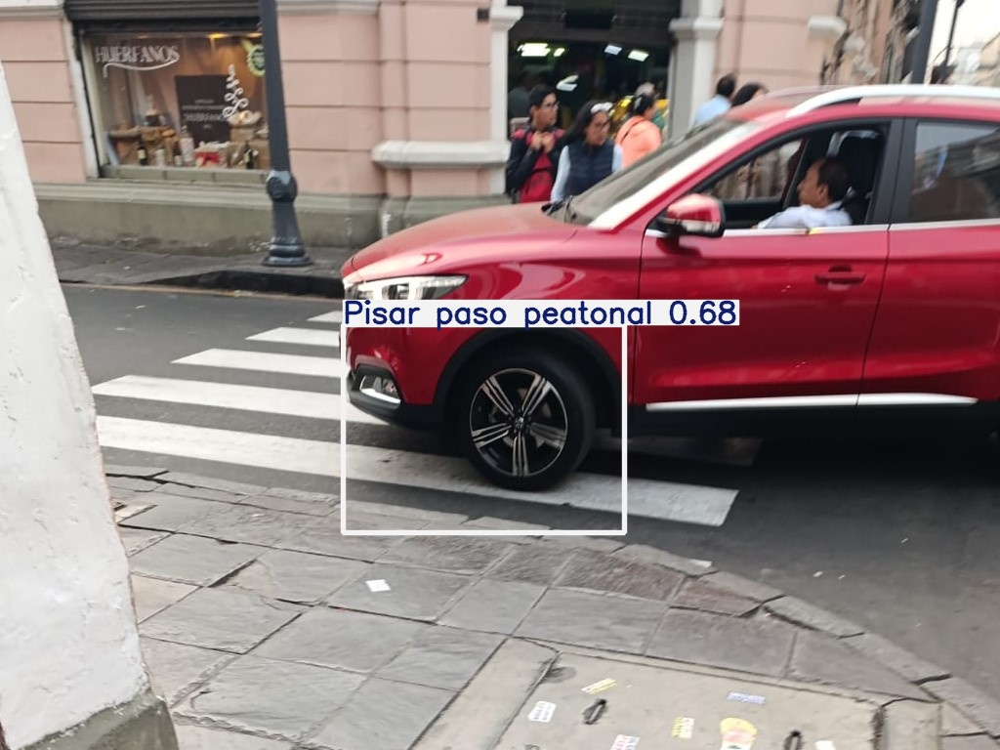

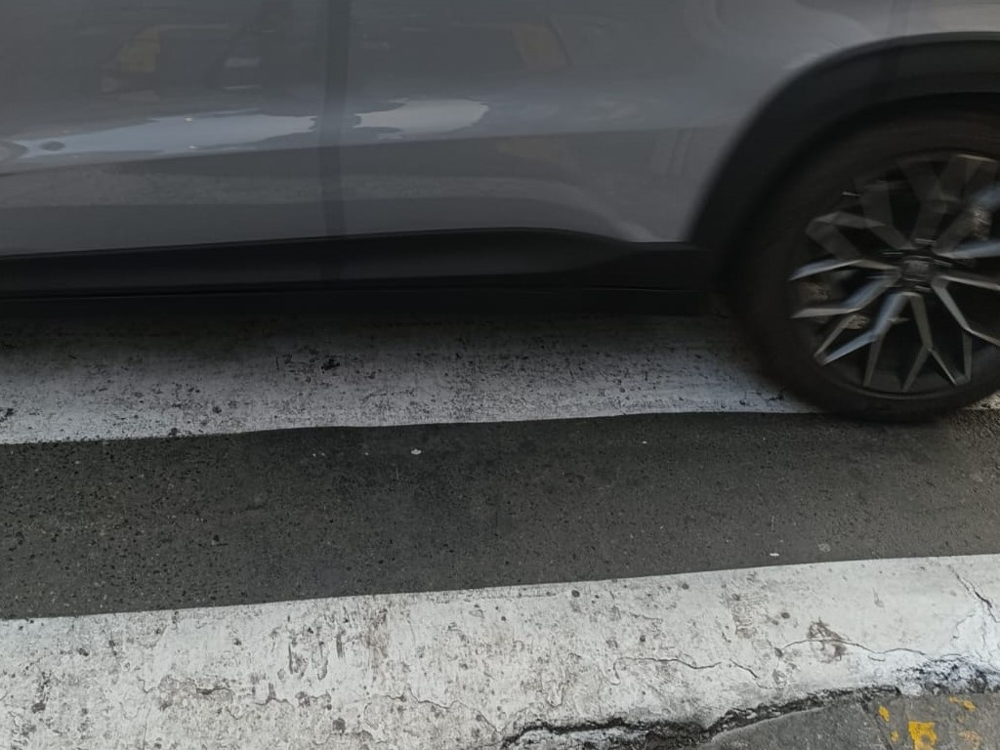

In [11]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg'):
	display(Image(filename=image_path, height=600))
	print("\n")

In [12]:
from google.colab import files

# Descargar el archivo .pt al sistema local
files.download('/content/runs/detect/train/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [13]:
# Load the model
model = YOLO("/content/runs/detect/train/weights/best.pt")

# Export the model to ONNX format
model.export(format="onnx")

Ultralytics 8.3.32 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLO11m summary (fused): 303 layers, 20,032,345 parameters, 0 gradients, 67.7 GFLOPs

PyTorch: starting from '/content/runs/detect/train/weights/best.pt' with input shape (1, 3, 736, 736) BCHW and output shape(s) (1, 7, 11109) (38.7 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0', 'onnxslim', 'onnxruntime'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 265.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.8/141.8 kB 296.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 282.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 247.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 311.7 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 7.3s, installed 3 packages: ['onnx>=1.12.0', 'onnxslim', 'onnxruntime']
requirements: ⚠️ Restart runtime or rerun command for u

'/content/runs/detect/train/weights/best.onnx'

In [14]:
files.download('/content/runs/detect/train/weights/best.onnx')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>